# Complete Exploratory Data Analysis and Visualization for Text Data
By Ankit Chaudhary


## Table of Contents:

1. Introduction
* Gathering data
* Assessing data
* Cleaning data
* Storing, 
* Analyzing, and Visualizing

#### How to combine visualization and NLP in order to generate insights in an intuitive way.
## Introduction
We will use Womens Clothing E-Commerce Reviews data set (https://www.kaggle.com/nicapotato/womens-ecommerce-clothing-reviews), and try to explore and visualize as much as we can, using  Bokeh visualization library. Not only we are going to explore text data, but also we will visualize numeric and categorical features. Let’s get started!

In [1]:
# import libraries
from collections import Counter
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer

from textblob import TextBlob

import warnings 
warnings.filterwarnings('ignore')
%matplotlib inline
%load_ext autoreload
%autoreload 2

### Gathering Data

In [2]:
# import dataset
PATH = ""
!ls {PATH}

EDA and Visualization for Text Data.ipynb
Womens Clothing E-Commerce Reviews.csv


In [3]:
# Reading Data
df = pd.read_csv('Womens Clothing E-Commerce Reviews.csv')
df.head()

,Unnamed: 0,Clothing ID,Age,Title,Review Text,Rating,Recommended IND,Positive Feedback Count,Division Name,Department Name,Class Name
0,0,767,33,NaN,Absolutely wonderful - silky and sexy and comf...,4,1,0,Initmates,Intimate,Intimates
1,1,1080,34,NaN,Love this dress! it's sooo pretty. i happene...,5,1,4,General,Dresses,Dresses
2,2,1077,60,Some major design flaws,I had such high hopes for this dress and reall...,3,0,0,General,Dresses,Dresses
3,3,1049,50,My favorite buy!,"I love, love, love this jumpsuit. it's fun, fl...",5,1,0,General Petite,Bottoms,Pants
4,4,847,47,Flattering shirt,This shirt is very flattering to all due to th...,5,1,6,General,Tops,Blouses


### Assesing Data:

In [4]:
df.shape

(23486, 11)

### Content Issues:

Series of Data Preprocessing, we need to work on these Quality Issues:
1. Remove 'Unnamed: 0' feature 
2. Remove 'Title' feature.
- Remove rows where 'Review Text' were missing.
- Clean 'Review Text' column.
- Create New feature for length of the review
- Create new feature for the word count of the review.
- Calculate sentiment Polarity which lies in the range of [-1,1] where 1 means positive sentiment and -1 means a negative sentiment. Using TextBlob Library

### Cleaning Data:

In [5]:
#1. removing 'Unnamed: 0' feature
df.drop('Unnamed: 0', axis =1, inplace=True)

#2. removing 'Title' feature
df.drop('Title', axis = 1, inplace=True)

#3. removing NULL values from 'Review Text feature'
df = df[~df['Review Text'].isnull()]

In [6]:
# check dataframe
df.head(2)

,Clothing ID,Age,Review Text,Rating,Recommended IND,Positive Feedback Count,Division Name,Department Name,Class Name
0,767,33,Absolutely wonderful - silky and sexy and comf...,4,1,0,Initmates,Intimate,Intimates
1,1080,34,Love this dress! it's sooo pretty. i happene...,5,1,4,General,Dresses,Dresses


In [7]:
# checking 'Review Text' for cleaning
for i in range(0, 4):
    print(df['Review Text'][i])
    print()

Absolutely wonderful - silky and sexy and comfortable

Love this dress!  it's sooo pretty.  i happened to find it in a store, and i'm glad i did bc i never would have ordered it online bc it's petite.  i bought a petite and am 5'8".  i love the length on me- hits just a little below the knee.  would definitely be a true midi on someone who is truly petite.

I had such high hopes for this dress and really wanted it to work for me. i initially ordered the petite small (my usual size) but i found this to be outrageously small. so small in fact that i could not zip it up! i reordered it in petite medium, which was just ok. overall, the top half was comfortable and fit nicely, but the bottom half had a very tight under layer and several somewhat cheap (net) over layers. imo, a major design flaw was the net over layer sewn directly into the zipper - it c

I love, love, love this jumpsuit. it's fun, flirty, and fabulous! every time i wear it, i get nothing but great compliments!



In [8]:
#4. Cleaning 'Review Text' feature

def preprocess(text):
    clean_review = text.str.replace('(<br/>)', '')
    clean_review = text.str.replace('(<a).*(>).*(</a>)', '')
    clean_review = text.str.replace('(&amp)', '')
    clean_review = text.str.replace('(&gt)', '')
    clean_review = text.str.replace('(&lt)', '')
    clean_review = text.str.replace('(\xa0)', '')
    return clean_review
    
    
df['Review Text'] = preprocess(df['Review Text'])

In [9]:
#5,6,7 New columns for polarity, length and word count of 'Review Text'
df['Polarity'] = df['Review Text'].map(lambda text: TextBlob(text).sentiment.polarity)

In [10]:
df['Review_Length'] = df['Review Text'].astype(str).apply(len)

In [11]:
df['Word_Count'] = df['Review Text'].apply(lambda x: len(str(x).split()))

In [12]:
df.head(1)

,Clothing ID,Age,Review Text,Rating,Recommended IND,Positive Feedback Count,Division Name,Department Name,Class Name,Polarity,Review_Length,Word_Count
0,767,33,Absolutely wonderful - silky and sexy and comf...,4,1,0,Initmates,Intimate,Intimates,0.633333,53,8


Checking Sentiment Polarity score by selecting 5 random reviews with highest polairty of 1:

In [13]:
print('5 random reviews with the highest positive sentiment polarity: \n')
reviews = df.loc[df.Polarity == 1, ['Review Text']].sample(5).values
for review in reviews:
    print(review[0])
    print('')

5 random reviews with the highest positive sentiment polarity: 

Made my wedding outfit perfect!

Perfect for lunch with the girls, pta, or saturdays with the family. this skirt is a perfect addition to your fall wardrobe.

The details and colors are exquisite. stop hesitating and get this dress

This dress is so versatile. great summer wear!

Great dress for vacations!



Checking Sentiment Polarity score by selecting 5 random reviews with highest polairty of 0:

In [14]:
print('5 random reviews with the highest neutral sentiment polarity: \n')
reviews =  df.loc[df.Polarity == 0, ['Review Text']].sample(5).values
for review in reviews:
    print(review[0])
    print('')

5 random reviews with the highest neutral sentiment polarity: 

Wonderful sweater and fashionable for autumn. the only thing i do not like about the sweater is that it sheds very bad. bring a lint roller with you when you wear the sweater!

The print doesn't necessarily works for everybody.

The catalog shot and model shot are completely different. it's like not even the same dress. the neckline, color, the quality of lace

I'm 5'3 and ordered the small. as soon as i saw it in person, i knew it was an item to return. the material is too transparent, and designed to wear with undergarments or swim gear that you want people to see. it was way too long for me. i think it would work for a taller person. i just didn't feel it was worth the money for the quality and transparency.

Well fitted kinda slouchy sweater. matches photo and product description. looking forward to cooler temps!



In [15]:
# checking minimum Polarity of Reviews
df.Polarity.min()

-0.9750000000000001

In [16]:
df.loc[df.Polarity == -0.9750000000000001]

,Clothing ID,Age,Review Text,Rating,Recommended IND,Positive Feedback Count,Division Name,Department Name,Class Name,Polarity,Review_Length,Word_Count
14754,868,52,"Cut out design, no seems or hems.\r\n very dis...",1,0,0,General,Tops,Knits,-0.975,65,11
20502,870,61,Received this product with a gaping hole in it...,1,0,1,General,Tops,Knits,-0.975,121,21


In [17]:
print('2 random reviews with the negative positive sentiment polarity: \n')
reviews =  df.loc[df.Polarity == -0.9750000000000001, ['Review Text']].sample(2).values
for review in reviews:
    print(review[0])

2 random reviews with the negative positive sentiment polarity: 

Cut out design, no seems or hems.
 very disappointed in retailer
Received this product with a gaping hole in it. very disappointed in the quality and the quality control at the warehouse


### Analyzing and Visualizing Data

#### 1. Univariate Visualization
Univariate visualization includes histogram, bar plots and line charts.

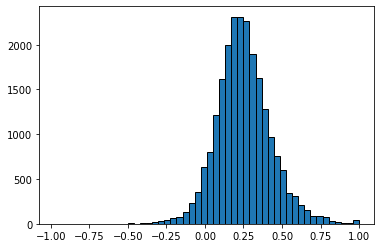

In [18]:
# Distrinution of Review Polarity Score
plt.hist(df['Polarity'], bins = 50, edgecolor='black')
plt.show()

Vast majority of sentiment polarity scores are greater than zero, means most of them are positive

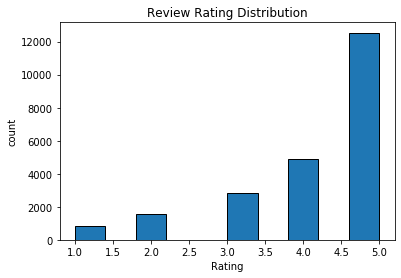

In [19]:
# Distribution of Review Ratings
plt.hist(df['Rating'], edgecolor = 'black')
plt.xlabel('Rating')
plt.ylabel('count')
plt.title('Review Rating Distribution')
plt.show()

Ratings are in align with Polarity Score, that is most of the ratings are pretty high at 4 or 5.

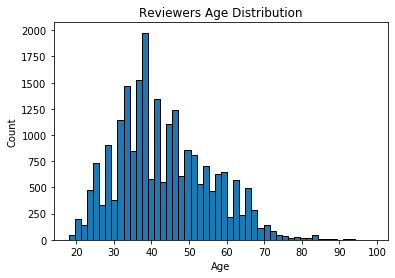

In [20]:
# Distribution of Review Ratings
plt.hist(df['Age'], edgecolor = 'black', bins=50)
plt.xlabel('Age')
plt.ylabel('Count')
plt.title('Reviewers Age Distribution')
plt.show()

Most reviewers are in the age between 30s and 40s

In [21]:
# [Categorical Features - Bar Chart]

# Distribution of Division Name 
fig = px.bar(df.groupby('Division Name').count()['Clothing ID'])
fig.show()

In [22]:
# Distribution of department
fig = px.bar(df.groupby('Department Name').count()['Clothing ID'].sort_values(ascending=False))
fig.show()

In [23]:
# Distribution of Class
fig = px.bar(df.groupby('Class Name').count()['Clothing ID'].sort_values(ascending=False))
fig.update_layout(title_text='Bar chart of Class Name')
fig.show()

Before exploring 'Review Text' feature, we need to extract N-Gram features. N-grams are used to describe the number of words used as observation points, e.g., unigram means singly-worded, bigram means 2-worded phrase, and trigram means 3-worded phrase. In order to do this, we use scikit-learn’s CountVectorizer function.

###### - The distribution of top unigrams before removing stop words

In [24]:
def get_topN_unigram_words(corpus, n = None):
    vec = CountVectorizer().fit(corpus)
    bow = vec.transform(corpus)
    sum_words = bow.sum(axis=0)
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq = sorted(words_freq, key = lambda x:x[1], reverse=True)
    return words_freq[:n]

common_words = get_topN_unigram_words(df['Review Text'], 20)

In [25]:
for word, freq in common_words:
    print(word, freq)

the 76166
it 49284
and 49009
is 30641
this 25762
to 24583
in 20723
but 16556
on 15328
for 14000
of 13429
with 12803
was 12221
so 12023
my 11028
dress 10567
that 10014
not 9799
love 8951
size 8772


In [26]:
# Distribution of Class
df_x = pd.DataFrame(common_words, columns = ['ReviewText' , 'count'])
fig = px.bar(df_x.groupby('ReviewText').sum()['count'].sort_values(ascending=False))
fig.update_layout(title_text='Top 20 words in review before removing stop words')
fig.show()

#### - The distribution of top unigrams after removing stop words

In [29]:
def get_topN_unigram_words(corpus, n = None):
    vec = CountVectorizer(stop_words='english').fit(corpus)
    bow = vec.transform(corpus)
    sum_words = bow.sum(axis=0)
    words_freq = [(word, sum_words[0,idx]) for word, idx in vec.vocabulary_.items()]
    words_freq = sorted(words_freq, key = lambda x:x[1], reverse=True)
    return words_freq

common_words = get_topN_unigram_words(df['Review Text'],20)

In [30]:
for word, freq in common_words:
    print(word, freq)

dress 10567
love 8951
size 8772
fit 7325
like 7149
wear 6439
great 6117
just 5608
fabric 4798
small 4729
color 4605
look 4039
really 3925
ordered 3850
little 3775
perfect 3774
flattering 3519
soft 3343
comfortable 3060
cute 3042
nice 3024
bought 2986
beautiful 2964
looks 2875
bit 2866
fits 2855
large 2842
shirt 2824
material 2765
length 2679
sweater 2550
long 2466
got 2420
jeans 2402
colors 2382
waist 2356
petite 2353
quality 2297
medium 2282
xs 2218
pretty 2194
think 2186
retailer 2161
work 2123
tried 2083
store 2026
usually 2009
skirt 1976
good 1959
pants 1917
short 1915
way 1881
big 1856
cut 1842
don 1806
didn 1772
black 1767
right 1728
super 1726
true 1695
did 1692
runs 1685
style 1673
sleeves 1602
online 1595
summer 1551
purchased 1532
white 1531
wearing 1531
design 1525
does 1495
feel 1469
tight 1446
perfectly 1431
model 1381
definitely 1339
looked 1321
sale 1317
blue 1308
price 1289
person 1287
lbs 1279
loved 1269
better 1235
jacket 1214
body 1201
fall 1200
going 1184
loose 1181

110 95
construction 95
noted 95
notice 95
structure 95
wrinkles 95
hopes 94
pulling 94
36d 94
attached 94
washes 94
strapless 94
35 94
outside 94
pop 94
choice 93
opening 93
im 93
weigh 93
olive 93
dd 93
event 93
vintage 93
tone 93
seeing 93
muted 93
fix 92
paid 92
difference 92
stick 92
muscular 92
00 92
boyfriend 92
turquoise 92
early 92
hate 92
0p 91
terrible 91
pleasantly 91
peach 91
jersey 91
busted 91
areas 91
attention 91
occasions 91
designer 91
pic 90
dots 90
disappoint 90
suggest 90
date 90
surprisingly 89
beauty 89
exception 89
thinner 89
lost 89
combo 89
dream 89
covered 89
sending 89
initially 88
bother 88
nicer 88
wonderfully 88
adjustable 87
later 87
fabrics 87
med 87
support 87
teal 87
quickly 87
awful 87
giving 87
christmas 86
flimsy 86
hemmed 86
overwhelming 86
star 86
trip 86
start 86
vibe 86
mom 85
taupe 85
negative 85
compared 85
change 85
statement 85
blend 85
currently 85
concerned 85
bathing 85
whim 84
ties 84
breezy 84
shopping 84
entire 84
pocket 84
sleeveless

execution 18
adjusting 18
ribcage 18
neon 18
depth 18
broken 18
tissue 18
sa 18
fussy 18
gigantic 18
snagging 18
raised 18
thanksgiving 18
precious 18
bordeaux 18
stood 18
hat 18
afternoon 18
teh 17
snapped 17
lazy 17
tags 17
asking 17
rolls 17
book 17
adjusted 17
mediums 17
fibers 17
face 17
alter 17
friendly 17
heads 17
si 17
bulge 17
july 17
secondly 17
floppy 17
exceeded 17
wings 17
enhance 17
lover 17
fray 17
delight 17
oatmeal 17
mannequin 17
function 17
li 17
floaty 17
suitable 17
btw 17
halfway 17
emphasize 17
wet 17
essential 17
stiffer 17
copper 17
123 17
slips 17
sets 17
buttery 17
70s 17
richer 17
strip 17
winters 17
instagram 17
crooked 17
dips 17
pastel 17
cobalt 17
blues 17
hems 17
park 17
bird 17
fortunately 17
carried 17
alteration 17
causal 17
spanx 17
floreat 17
grandma 17
previously 17
fading 17
ugh 17
promotion 17
reddish 17
achieve 17
washer 17
percent 17
zips 17
18 17
pain 17
alot 17
hooks 17
buttoning 17
citizens 17
ribs 17
126 17
abt 17
irl 17
trapeze 17
necess

sheet 7
itches 7
maintain 7
calling 7
____________ 7
21 7
drawstrings 7
speaking 7
sweatshirts 7
offset 7
stretchiness 7
wearings 7
scrunch 7
32f 7
cognac 7
loss 7
realizing 7
afford 7
backordered 7
visiting 7
2015 7
universally 7
humanity 7
versa 7
wea 7
joke 7
windy 7
luxuriously 7
steps 7
forearm 7
festival 7
destroyed 7
unable 7
ar 7
motifs 7
presentation 7
shoppers 6
ver 6
tigh 6
brunette 6
positioned 6
patter 6
catches 6
112lbs 6
recieved 6
cedar 6
peeks 6
wavy 6
snake 6
vent 6
lucked 6
impact 6
australian 6
weak 6
colours 6
rumpled 6
female 6
tugging 6
richly 6
handful 6
anxious 6
appearing 6
realistic 6
exclusively 6
aspects 6
information 6
maintaining 6
chair 6
glitter 6
squeezed 6
selection 6
solids 6
148 6
longest 6
isnt 6
droop 6
tested 6
runner 6
god 6
aesthetics 6
preppy 6
peacock 6
zippered 6
struggled 6
belonged 6
fooled 6
confortable 6
corners 6
valentine 6
activities 6
quote 6
improve 6
180 6
successfully 6
pucker 6
creasing 6
pit 6
heartbroken 6
seldom 6
costs 6
tape

wais 3
incorrect 3
voluptuous 3
abo 3
arty 3
boardwalk 3
regain 3
lives 3
concerning 3
costly 3
extras 3
fabr 3
combat 3
team 3
swear 3
twirly 3
awards 3
cooling 3
woolite 3
polish 3
outcome 3
horrendous 3
146lbs 3
ed 3
unfamiliar 3
blocked 3
supper 3
perf 3
reshaped 3
eggplant 3
bomb 3
colr 3
speck 3
cozier 3
cafe 3
fla 3
survived 3
throat 3
accessorizing 3
seaside 3
overnight 3
students 3
source 3
newly 3
butts 3
residual 3
detect 3
gear 3
midway 3
saddle 3
released 3
historically 3
blog 3
innocent 3
essence 3
numbers 3
letters 3
doe 3
pi 3
stinking 3
jazzed 3
colorfast 3
13 3
trimmer 3
abby 3
128lb 3
claimed 3
athleisure 3
peite 3
dishes 3
exceeds 3
mes 3
knocks 3
backed 3
imaging 3
str 3
terra 3
tick 3
imagination 3
liquid 3
renaissance 3
charge 3
hybrid 3
failing 3
authentic 3
scandalous 3
reminding 3
scratchier 3
peaking 3
pilcrow 3
uncovered 3
rectangular 3
conference 3
nipples 3
insecurities 3
offs 3
eyeballing 3
bachelorette 3
nurse 3
flowery 3
cupro 3
distract 3
165lbs 3
clo 

dates 2
burns 2
singing 2
mullet 2
especia 2
pause 2
sepia 2
fatty 2
1990 2
pondering 2
district 2
disposable 2
reall 2
pilcos 2
longs 2
blank 2
coloured 2
remembering 2
mattress 2
luncheons 2
perhap 2
remade 2
torture 2
device 2
recipient 2
evergreen 2
mountains 2
yup 2
lunches 2
greater 2
jutted 2
minimalist 2
disappoin 2
optimal 2
finesse 2
mold 2
cartoon 2
mysteriously 2
furniture 2
popback 2
stomachs 2
1987 2
rediculously 2
stud 2
foo 2
dazzled 2
cutaway 2
forms 2
chin 2
sizi 2
broaden 2
assessing 2
petities 2
sways 2
pushup 2
thesis 2
situated 2
colorwise 2
stare 2
sw 2
photoshopped 2
monica 2
sexyness 2
risquã 2
overwhelms 2
rent 2
danced 2
headband 2
periodically 2
corduroys 2
fluttering 2
musical 2
cinnamon 2
sparingly 2
midrise 2
fool 2
junior 2
cashier 2
accenting 2
pounced 2
mateiral 2
dealbreaker 2
amazon 2
thermals 2
whale 2
95lb 2
joan 2
abou 2
shaper 2
20th 2
waits 2
marvel 2
woolen 2
cohesive 2
spun 2
genie 2
horizontally 2
harsh 2
breton 2
married 2
melt 2
repertoire 

nv 1
fascinating 1
giantess 1
transistional 1
beau 1
hysterically 1
hurting 1
8yo 1
whiteness 1
hypos 1
fantasia 1
tiem 1
otherwsie 1
mifnight 1
laways 1
matl 1
jearns 1
finially 1
besid 1
sutble 1
remiss 1
faculty 1
father 1
outstretched 1
conside 1
dynamic 1
eyeglass 1
sunglass 1
nuance 1
favulous 1
jewlery 1
sumo 1
wrestler 1
allergies 1
stat 1
sateens 1
versital 1
frabic 1
constraining 1
coke 1
bottle 1
beauti 1
ple 1
adhesive 1
fuzzes 1
sample 1
twig 1
sma 1
categorize 1
goon 1
dapper 1
30lbs 1
xspwas 1
_________________ 1
crisper 1
hwy 1
colla 1
meatiness 1
adoring 1
takeaway 1
strokes 1
im5 1
discourages 1
minneapol 1
battling 1
tucker 1
simpleness 1
quads 1
attn 1
photographers 1
eaisly 1
gentlemen 1
irvine 1
revert 1
arise 1
elastisized 1
aleardy 1
drawer 1
pretties 1
amenable 1
bandages 1
godets 1
florascura 1
possess 1
inward 1
boobed 1
appopriate 1
dolce 1
vita 1
daydreaming 1
honeymooning 1
cinque 1
terre 1
outsi 1
dryers 1
imagining 1
sueded 1
mimic 1
sari 1
polyestery 1


fitt 1
36j 1
ls 1
minimizing 1
hardy 1
xxxs 1
usefulness 1
scope 1
awareness 1
sai 1
sungarden 1
trusting 1
uptown 1
spattering 1
dr4ess 1
density 1
42dd 1
naught 1
qa 1
sherbet 1
tattered 1
choise 1
ought 1
punks 1
openwork 1
uniquenesses 1
pvc 1
relazation 1
dictated 1
lens 1
laura 1
marching 1
cloying 1
invited 1
restretched 1
inauthentic 1
modei 1
repackaged 1
deleted 1
exhilarating 1
duffs 1
substancial 1
tirst 1
tme 1
prisoner 1
maui 1
msut 1
wrng 1
bude 1
flounces 1
pomona 1
grandmotherly 1
130pounds 1
loooks 1
satisfy 1
porcelain 1
chick 1
brushstroke 1
cinderalla 1
bustle 1
aided 1
jury 1
measur 1
resembled 1
attachments 1
races 1
genuine 1
purchasable 1
thx 1
blowsey 1
canopy 1
neighbor 1
international 1
worldly 1
wintery 1
somethin 1
wintergreens 1
hovered 1
preview 1
nymph 1
downed 1
striving 1
botom 1
loosly 1
btoh 1
mite 1
vanit 1
cables 1
weekender 1
revisitation 1
afghan 1
136lb 1
darkness 1
loook 1
camre 1
beuatiful 1
retrospect 1
suprisingly 1
clipdot 1
paleface 1
spe

flecking 1
dubbed 1
pairings 1
pineapples 1
really0 1
lslightly 1
spacious 1
undertsated 1
training 1
obsessively 1
annnnd 1
spider 1
sheerish 1
fp 1
htere 1
differentials 1
necessairly 1
similr 1
alce 1
drkest 1
flatetering 1
lunging 1
105lb 1
havin 1
hawk 1
cop 1
milestone 1
mellowed 1
hightower 1
sheeny 1
flea 1
teller 1
leng 1
slitted 1
stilt 1
palo 1
alto 1
edessa 1
itsy 1
bitsy 1
ear 1
bumpkin 1
obsessive 1
revi 1
tagged 1
influenced 1
costumed 1
descriptive 1
route 1
shattered 1
deem 1
discrepancies 1
tig 1
stored 1
gas 1
station 1
inflexibility 1
nolan 1
claire 1
underwood 1
flung 1
colony 1
cratsmanship 1
apttenrs 1
seasonality 1
sleeps 1
prolong 1
pancho 1
restretching 1
stretchable 1
predominately 1
fiattering 1
shaver 1
accompany 1
colw 1
tummmy 1
purchae 1
smal 1
brests 1
alleviate 1
dressiness 1
huit 1
eden 1
lagoon 1
tassle 1
poodles 1
estatic 1
substan 1
nevermind 1
horizont 1
perceive 1
raindrops 1
upsid 1
homage 1
conversationalist 1
27in 1
negligee 1
planner 1
rol 1


jiggling 1
accord 1
veered 1
brethren 1
compfy 1
colletage 1
knobby 1
goose 1
abercrombie 1
newsies 1
caressing 1
interim 1
voom 1
summarize 1
tossing 1
min 1
creamsicle 1
positing 1
withhold 1
squarple 1
haired 1
minority 1
delaney 1
4fits 1
ier 1
nigh 1
delaine 1
ruggedness 1
easyily 1
cleani 1
34ff 1
bue 1
23b 1
inwas 1
lsit 1
modl 1
ute 1
brught 1
onin 1
somuch 1
laec 1
temple 1
cheshire 1
chafe 1
fought 1
toddlers 1
frumpiness 1
rath 1
laceing 1
punches 1
corresponded 1
howeverl 1
henely 1
futuristic 1
pry 1
oatmealish 1
trapezey 1
renatkable 1
patt 1
deminished 1
nutmeg 1
amt 1
seperate 1
stroke 1
unprofessionally 1
peacoat 1
orangeish 1
attractively 1
taco 1
measument 1
baggish 1
bonette 1
submit 1
whiled 1
ooohed 1
aaahed 1
hurriedly 1
belive 1
veltevty 1
carton 1
comfim 1
dissapointing 1
enormously 1
smack 1
dab 1
nonuniform 1
pacifica 1
comparat 1
leana 1
farthest 1
staged 1
surplus 1
pencils 1
unsuccessful 1
zooming 1
wanna 1
cue 1
darlings 1
snowstorm 1
foldable 1
reflectiv

casualties 1
expedited 1
insides 1
corer 1
opaqueness 1
askedher 1
nonte 1
locally 1
wardrobes 1
produces 1
mightn 1
mola 1
vanilla 1
poked 1
disadvantage 1
exteemely 1
dual 1
clas 1
hone 1
aquaflora 1
itried 1
keeo 1
deresses 1
commet 1
lifelong 1
bathed 1
impresssionistic 1
suspicion 1
contest 1
murkier 1
smokey 1
discerning 1
cerise 1
sustainably 1
ghana 1
responsibly 1
drapy 1
pilcto 1
puckery 1
38dds 1
f21 1
horrific 1
bulking 1
10l 1
bs 1
monroe 1
rage 1
modcloth 1
20x 1
amber 1
fillerup 1
clark 1
mono 1
kini 1
inferior 1
doomed 1
gate 1
splashed 1
startled 1
splashy 1
calvin 1
klein 1
numeric 1
swimmingly 1
joked 1
wars 1
rotating 1
comp 1
uch 1
materil 1
ocol 1
itlooks 1
farmhand 1
zombie 1
deco 1
consumed 1
pessimist 1
nothings 1
tuc 1
picturing 1
wisely 1
benefitted 1
christening 1
alert 1
appetite 1
toenails 1
pierce 1
spa 1
garter 1
mourn 1
evaluate 1
checkers 1
grams 1
readily 1
choppy 1
repurpose 1
accumulate 1
zara 1
copy 1
sierra 1
mishap 1
beating 1
batty 1
genuinely 1

toying 1
unsolvable 1
elected 1
furrowing 1
irradiates 1
slovak 1
oddest 1
discuss 1
pers 1
singly 1
leblon 1
loooooove 1
atypical 1
creativity 1
decolltage 1
irks 1
lizard 1
frye 1
jane 1
connector 1
sunnies 1
attempts 1
annoyingly 1
undefined 1
disappointedly 1
pacquerette 1
anwen 1
cris 1
butit 1
riiiiiiiiiip 1
chestier 1
sanded 1
suport 1
limned 1
strang 1
viewing 1
organ 1
organist 1
scratched 1
ironically 1
wicking 1
embroiderey 1
companion 1
slone 1
rouge 1
readying 1
broadness 1
cringed 1
112llbs 1
pret 1
sweetest 1
aversion 1
underdress 1
blute 1
adventurous 1
ilove 1
lovin 1
rap 1
imagin 1
snuggie 1
odrdered 1
swaeter 1
royalty 1
diligent 1
pristine 1
concho 1
rasberry 1
alr 1
familiar 1
practices 1
involve 1
gogo 1
116ibs 1
whihc 1
havne 1
abruptly 1
izing 1
numero 1
uno 1
roars 1
2012 1
middleton 1
anita 1
dongre 1
graduations 1
cations 1
sufficiently 1
cinchable 1
big0 1
orlando 1
divide 1
fins 1
220lbs 1
horticulture 1
core 1
cuten 1
strangly 1
unexciting 1
ladybugs 1
toy

In [35]:
df_x = pd.DataFrame(common_words, columns = ['ReviewText' , 'count'])
fig = px.bar(df_x.groupby('ReviewText').sum()['count'].sort_values(ascending=False))
fig.update_layout(title_text='Top 20 words in review after removing stop words')
fig.show()

#### - The distribution of top Bigrams before removing stop words

In [32]:
def get_topN_bigram_words(corpus, n=None):
    vec = CountVectorizer(ngram_range=(2,2)).fit(corpus)
    bow = vec.transform(corpus)
    sum_words = bow.sum(axis=0)
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq

common_words = get_topN_bigram_words(df['Review Text'], 20)

for word, freq in common_words:
    print(word, freq)

In [34]:
df_x = pd.DataFrame(common_words, column = ['Review Text', 'count'])
fig = px.bar(df_x.groupby('ReviewText').sum()['count'].sort_values(ascending=False))
fig.update_layout(title_text='Top 20 words in review after removing stop words')
fig.show()

TypeError: __init__() got an unexpected keyword argument 'column'